In [ ]:
from pathlib import Path

# Download the data stored in a zipped numpy array from one of these two locations
# The uncommented one is likely to be faster. If you're running all your experiments
# on a machine at home rather than using colab, then make sure you save it 
# rather than repeatedly downloading it.
if not Path('training_images.npz').is_file():
  !wget "https://sussex.box.com/shared/static/cbvuazevif0oczabom06zl2x7ukakbqj.npz" -O training_images.npz
#!wget "http://users.sussex.ac.uk/~is321/training_images.npz" -O training_images.npz
# The test images (without points)
if not Path('test_images.npz').is_file():
  !wget "http://users.sussex.ac.uk/~is321/test_images.npz" -O test_images.npz
# The example images are here
if not Path('examples.npz').is_file():
  !wget "http://users.sussex.ac.uk/~is321/examples.npz" -O examples.npz

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the data using np.load
data = np.load('training_images.npz', allow_pickle=True)

# Extract the images
images = data['images']
from skimage.transform import resize
# and the data points
pts = data['points']

# Given Methods

## Data Visualisation
Here's an example of how to display the images and their points

(2811, 236, 236, 3) (2811, 46, 2)


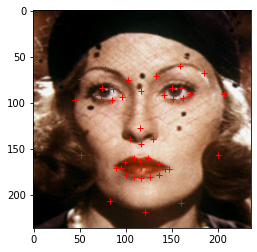

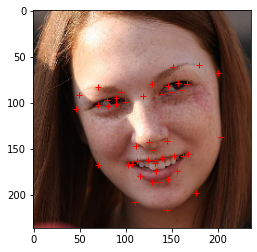

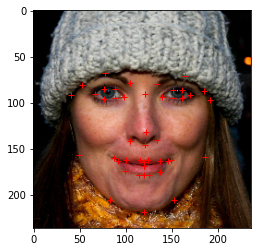

In [ ]:
print(images.shape, pts.shape)
def visualise_pts(img, pts):
  plt.imshow(img)
  plt.plot(pts[:, 0], pts[:, 1], '+r')
  plt.show()

for i in range(3):
  idx = np.random.randint(0, images.shape[0])
  visualise_pts(images[idx, ...], pts[idx, ...])

## Calculating Prediction Error and exporting results

In [ ]:
def euclid_dist(pred_pts, gt_pts):
  """
  Calculate the euclidean distance between pairs of points
  :param pred_pts: The predicted points
  :param gt_pts: The ground truth points
  :return: An array of shape (no_points,) containing the distance of each predicted point from the ground truth
  """
  pred_pts = np.reshape(pred_pts, (-1, 2))
  gt_pts = np.reshape(gt_pts, (-1, 2))
  return np.sqrt(np.sum(np.square(pred_pts - gt_pts), axis=-1))


In [ ]:
def save_as_csv(points, location = '.'):
  """
  Save the points out as a .csv file
  :param points: numpy array of shape (no_image, no_points, 2) to be saved
  :param location: Directory to save results.csv in. Default to current working directory
  """
  np.savetxt(location + '/results.csv', np.reshape(points, (points.shape[0], -1)), delimiter=',')


#Facial Landmark Detection

##Creating data set

###Points Dataset

In [ ]:
all_y = pts / 1000
all_y = np.array([point.flatten() for point in all_y])

###Image Dataset

In [ ]:
from skimage.io import imread
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure

In [ ]:
# Find shape
print(hog(images[i], orientations=9, pixels_per_cell=(5, 5), cells_per_block=(1, 1), visualize=False).shape)
print(hog(images[i], orientations=9, pixels_per_cell=(5, 5), cells_per_block=(1, 1), visualize=False, feature_vector=False).shape)

(19881,)
(47, 47, 1, 1, 9)


In [ ]:
from tqdm import tnrange, tqdm_notebook

# Converts the images to sets of feature vectors
hog_feature_sets = []
for i in tnrange(images.shape[0], desc='Images to HOG Feature Set'):
  hog_feature_sets.append(hog(images[i], orientations=9, pixels_per_cell=(5, 5), cells_per_block=(1, 1), visualize=False))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  after removing the cwd from sys.path.


In [ ]:
# Converts the set into a numpy array
all_x = np.array(hog_feature_sets)

###Split Data Set

In [ ]:
# Visual check if the sizes are equal
print(len(all_x))
print(len(all_y))

2811
2811


In [ ]:
# Used to split arrays into 70%, 24%, 6% for the data set 
def split_data(arr):
  # Finds the first split size
  split = int(arr.shape[0]* 0.70)

  arr70 = arr[:split , :]
  arr30 = arr[split: , :]

  # Splits the 30% into 24%, 6%
  split = int(arr30.shape[0]* 0.80)

  arr24 = arr30[:split , :]
  arr6 = arr30[split: , :]

  # Returns the split array
  return arr70, arr24, arr6


In [ ]:
# Create the splits for each type of data
x_train, x_val, x_test = split_data(all_x)
y_train, y_val, y_test = split_data(all_y)
used_images, val_images, training_test_images = split_data(images)

In [ ]:
# Print the size of the x array and the shape of the points
print('80%', len(x_train))
print('16%', len(x_val))
print('4%', len(x_test))
print('Points', pts[1].shape)

80% 1967
16% 675
4% 169
Points (46, 2)


###Setting data set

In [ ]:
import tensorflow as tf
from IPython.display import Image
keras = tf.keras
layers = tf.keras.layers

In [ ]:
# Prepare the training dataset into batches and shuffle the examples
train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_dataset = train_dataset.shuffle(buffer_size=1024).batch(64)

# Prepare the validation dataset into batches
val_dataset = tf.data.Dataset.from_tensor_slices((x_val, y_val))
val_dataset = val_dataset.batch(64)

##CNN
Gonna be using tensorflow

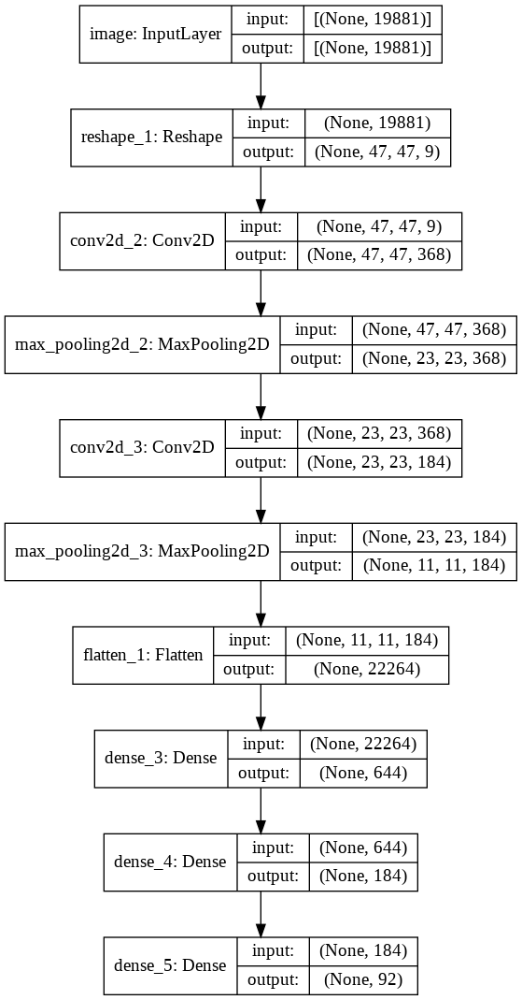

In [ ]:
def build_conv_model():
  # Uses the input of the feature vector
  inputs = keras.Input(shape=(19881), name="image")
  net = inputs

  # Reshapes the data to be used for the convolutional layers
  net = layers.Reshape((47, 47, 9))(net)

  # Creates the convolutional layer with 368 units (is a factor of 92) and is then max pooled
  conv1 = layers.Conv2D(filters=368, kernel_size=1, padding='same', activation='relu')
  net = conv1(net)
  net = layers.MaxPool2D()(net)

  # Creates the convolutional layer with 184 units to reduce the size and is then max pooled
  conv2 = layers.Conv2D(filters=184, kernel_size=1, padding='same', activation='relu')
  net = conv2(net)
  net = layers.MaxPool2D()(net)

  # We need to flatten the spatial dimensions before putting it through the dense layers
  net = layers.Flatten()(net)

  # This layer has 644 layers due to 7 main sections of face, 92 * 7 is 644
  dense1 = layers.Dense(units=644, activation='relu')
  net = dense1(net)

  # Reduce the size again
  dense2 = layers.Dense(units=184, activation='relu')
  net = dense2(net)

  # Final layer, uses sigmoid to squish the output to be between 0 and 1
  dense3 = layers.Dense(units=92, activation='sigmoid')
  net = dense3(net)

  # Returns the model
  return keras.Model(inputs=inputs, outputs=net)


# Builds the model and creates the diagram
conv_model = build_conv_model()
keras.utils.plot_model(conv_model, "conv_model.png", show_shapes=True)

##Training

In [ ]:
conv_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss="mean_squared_error", metrics=["accuracy"])
conv_model.fit(train_dataset, batch_size=64, epochs=500, validation_data=val_dataset)

Epoch 1/500
31/31 [==============================] - 2s 34ms/step - loss: 0.0372 - accuracy: 0.0566 - val_loss: 0.0024 - val_accuracy: 0.1230
Epoch 2/500
31/31 [==============================] - 1s 29ms/step - loss: 0.0014 - accuracy: 0.2614 - val_loss: 2.8155e-04 - val_accuracy: 0.7319
Epoch 3/500
31/31 [==============================] - 1s 29ms/step - loss: 1.9770e-04 - accuracy: 0.7818 - val_loss: 1.2099e-04 - val_accuracy: 0.7985
Epoch 4/500
31/31 [==============================] - 1s 30ms/step - loss: 1.0933e-04 - accuracy: 0.7851 - val_loss: 1.1759e-04 - val_accuracy: 0.7985
Epoch 5/500
31/31 [==============================] - 1s 30ms/step - loss: 1.0466e-04 - accuracy: 0.7933 - val_loss: 1.0228e-04 - val_accuracy: 0.7985
Epoch 6/500
31/31 [==============================] - 1s 30ms/step - loss: 9.3755e-05 - accuracy: 0.7837 - val_loss: 9.0268e-05 - val_accuracy: 0.7970
Epoch 7/500
31/31 [==============================] - 1s 29ms/step - loss: 8.6735e-05 - accuracy: 0.7893 - val_lo

In [ ]:
conv_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
image (InputLayer)           [(None, 19881)]           0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 47, 47, 9)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 47, 47, 368)       3680      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 23, 23, 368)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 23, 23, 184)       67896     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 11, 11, 184)       0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 22264)             0   

In [ ]:
conv_model.save('/content/model.h5')

##Evaluating Data

In [ ]:
data = np.load('test_images.npz', allow_pickle=True)

# Extract the images
test_images = data['images']

hog_test_images = []
for i in tnrange(test_images.shape[0], desc='Images to HOG Feature Set'):
  hog_test_images.append(hog(test_images[i], orientations=9, pixels_per_cell=(5,5), cells_per_block=(1, 1), visualize=False))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  import sys


In [ ]:
def get_all_predictions(arr):
  points = []
  for i in tnrange(arr.shape[0]):
    p = conv_model.predict(arr[i].copy().reshape(1, -1)) * 1000
    points.append(p.reshape(46,2))
  return np.array(points)

In [ ]:
all_test_predictions = get_all_predictions(x_test)
print(all_test_predictions.shape)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  This is separate from the ipykernel package so we can avoid doing imports until



(169, 46, 2)


In [ ]:
euclid_dist_pred_act = [euclid_dist(all_test_predictions[i], y_val[i]) for i in range(all_test_predictions.shape[0])]

euclid_dist_pred_act_avg = []
euclid_dist_pred_act_max = []
euclid_dist_pred_act_min = []

for i in range(len(euclid_dist_pred_act[0])):
  temp = float()
  cur_max = 0
  cur_min = 100000000000000

  for j in range(len(euclid_dist_pred_act)):
    temp += euclid_dist_pred_act[j][i]
    cur_max = euclid_dist_pred_act[j][i] if cur_max <  euclid_dist_pred_act[j][i] else cur_max
    cur_min = euclid_dist_pred_act[j][i] if cur_min >  euclid_dist_pred_act[j][i] else cur_min

  euclid_dist_pred_act_avg.append(temp / len(euclid_dist_pred_act))
  euclid_dist_pred_act_max.append(cur_max)
  euclid_dist_pred_act_min.append(cur_min)

In [ ]:
best = [[0], [100000000000000]]
worst = [[0], [0]]

for i in range(len(euclid_dist_pred_act)):
  cur_total = 0

  for j in range(len(euclid_dist_pred_act[0])):
    cur_total += euclid_dist_pred_act[i][j]

  if cur_total < best[1]:
    best[0] = i
    best[1] = cur_total

  elif cur_total > worst[0]:
    worst[0] = i
    worst[1] = cur_total

In [ ]:
p_avg = []
y_avg = []
y_test_reshaped = y_test.reshape(169, 46, 2) * 1000

for i in range(len(all_test_predictions[1])):
  p_temp = 0
  y_temp = 0

  for j in range(len(all_test_predictions[0])):
    p_temp += all_test_predictions[j][i]
    y_temp += y_test_reshaped[j][i]
    
  p_avg.append(p_temp / len(all_test_predictions))
  y_avg.append(y_temp / len(all_test_predictions))

p_avg = np.array(p_avg).flatten()
y_avg = np.array(y_avg).flatten()

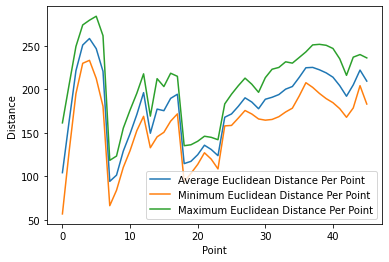

In [ ]:
plt.plot(euclid_dist_pred_act_avg, label='Average Euclidean Distance Per Point')
plt.plot(euclid_dist_pred_act_min, label='Minimum Euclidean Distance Per Point')
plt.plot(euclid_dist_pred_act_max, label='Maximum Euclidean Distance Per Point')
plt.xlabel("Point")
plt.ylabel("Distance")
plt.legend()
plt.savefig('1.png')
plt.show()

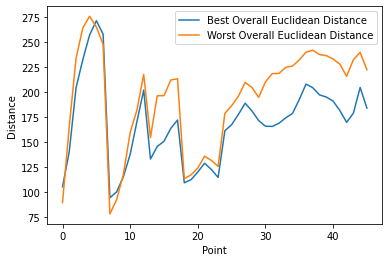

In [ ]:
plt.plot(euclid_dist_pred_act[best[0]], label='Best Overall Euclidean Distance')
plt.plot(euclid_dist_pred_act[worst[0]], label='Worst Overall Euclidean Distance')
plt.xlabel("Point")
plt.ylabel("Distance")
plt.legend()
plt.savefig('2.png')
plt.show()

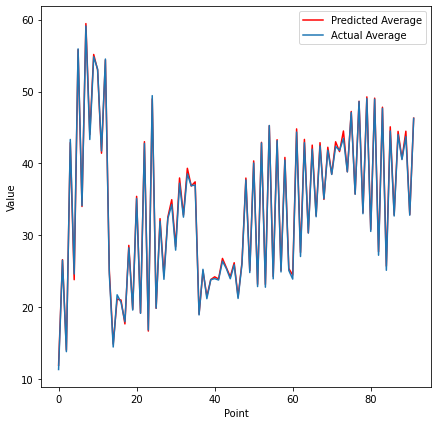

In [ ]:
plt.figure(figsize=(7,7))
plt.plot(p_avg, color='red', label='Predicted Average')
plt.plot(y_avg, label='Actual Average')
plt.xlabel("Point")
plt.ylabel("Value")
plt.legend()
plt.savefig('3.png')
plt.show()

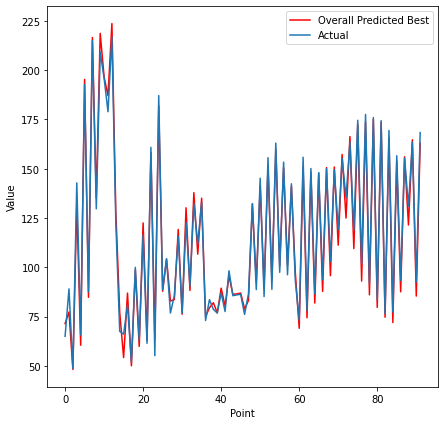

In [ ]:
plt.figure(figsize=(7,7))
plt.plot(all_test_predictions[best[0]].flatten(), color='red', label='Overall Predicted Best')
plt.plot(y_test_reshaped[best[0]].flatten(), label='Actual')
plt.xlabel("Point")
plt.ylabel("Value")
plt.legend()
plt.savefig('4.png')
plt.show()

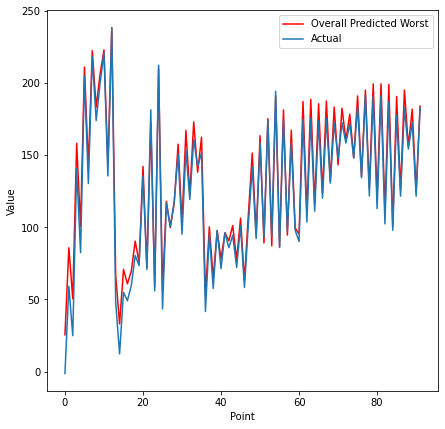

In [ ]:
plt.figure(figsize=(7,7))
plt.plot(all_test_predictions[worst[0]].flatten(), color='red', label='Overall Predicted Worst')
plt.plot(y_test_reshaped[worst[0]].flatten(), label='Actual')
plt.xlabel("Point")
plt.ylabel("Value")
plt.legend()
plt.savefig('5.png')
plt.show()

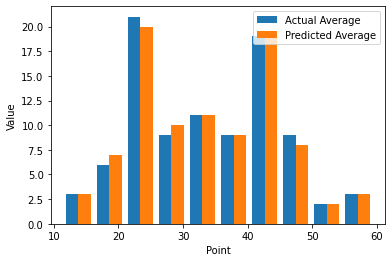

In [ ]:
plt.hist([p_avg, y_avg])
plt.legend(['Actual Average' , 'Predicted Average'])
plt.xlabel("Point")
plt.ylabel("Value")
plt.savefig('6.png')
plt.show()

In [ ]:
results = conv_model.evaluate(x_test, y_test)
print(results)

6/6 [==============================] - 0s 5ms/step - loss: 3.6521e-05 - accuracy: 0.8639
[3.652086525107734e-05, 0.8639053106307983]


In [ ]:
def predict_test(idx):
  img_hog = x_test[idx].copy()

  predicted_points = conv_model.predict(img_hog.reshape(1, -1))
  predicted_points = predicted_points * 1000
  predicted_points = predicted_points.reshape(46,2)

  actual_points = y_test[idx] * 1000
  actual_points = actual_points.reshape(46,2)

  print('Target: ')
  visualise_pts(training_test_images[idx], actual_points)
  print('Result: ')
  visualise_pts(training_test_images[idx], predicted_points)

Target: 


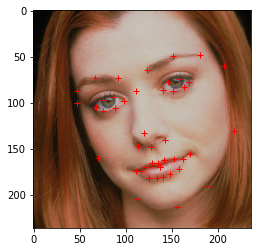

Result: 


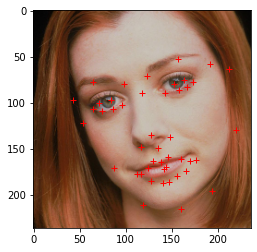

In [ ]:
predict_test(55)

In [ ]:
def visualise_pred_gt(img, pred_pts, gt_pts, name):
  fig, ax = plt.subplots(figsize=(7,7))
  ax.imshow(img)
  ax.plot(gt_pts[:, 0], gt_pts[:, 1], '+r', label = 'Actual')
  ax.plot(pred_pts[:, 0], pred_pts[:, 1], '+b', label = 'Predicted')
  ax.legend()
  plt.savefig('%s.png' % name)
  plt.show()

In [ ]:
def compare_pred_gt(idx, name):
  img_hog = x_test[idx].reshape(1, -1)

  predicted_points = conv_model.predict(img_hog)
  predicted_points = predicted_points * 1000
  predicted_points = predicted_points.reshape(46,2)

  actual_points = y_test[idx] * 1000
  actual_points = actual_points.reshape(46,2)

  visualise_pred_gt(training_test_images[idx], predicted_points, actual_points, name)

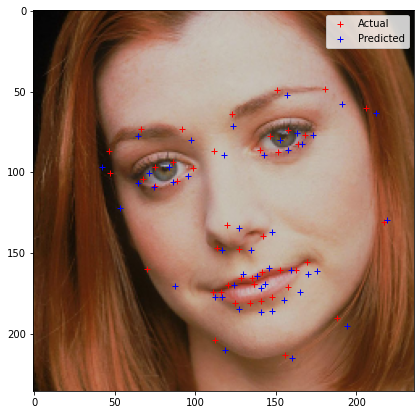

In [ ]:
compare_pred_gt(55, name='7')

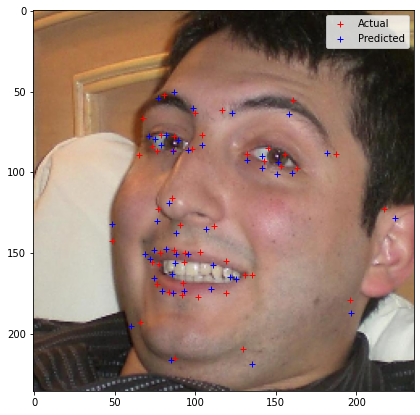

In [ ]:
compare_pred_gt(best[0], name='8')

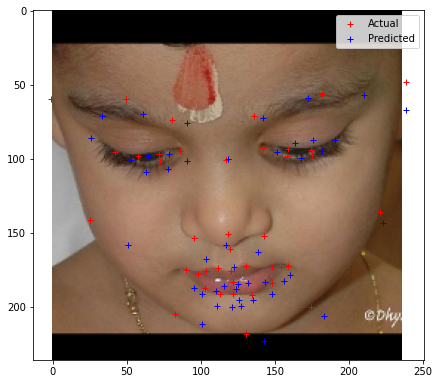

In [ ]:
compare_pred_gt(worst[0], name='9')

#Skin Face Segmentation

In [ ]:
def covert_point_locations(idx, val, name, show_points):
  if val:
    img = training_test_images[idx].copy()
  else:
    img = test_images[idx].copy()

  if val:
    predicted_points = conv_model.predict(x_test[idx].copy().reshape(1, -1))
  else:
    predicted_points = conv_model.predict(hog_test_images[idx].copy().reshape(1, -1))
  predicted_points = predicted_points * 1000
  predicted_points = predicted_points.reshape(46,2)

  predicted_points_copy = predicted_points.copy()
  predicted_points_copy[7:12] = predicted_points_copy[7:12][::-1]
  predicted_points_copy[14], predicted_points_copy[15] = predicted_points_copy[15].copy(), predicted_points_copy[14].copy()
  predicted_points_copy[16], predicted_points_copy[17] = predicted_points_copy[17].copy(), predicted_points_copy[16].copy()
  
  if show_points:
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.plot(predicted_points[:,0],predicted_points[:,1], 'ro', alpha = 0.5)

    for i in range(predicted_points.shape[0]):
      plt.text(predicted_points[i,0], predicted_points[i,1], str(i))
    plt.savefig('%s-pre-points.png' % name)

    plt.show()

    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.plot(predicted_points_copy[:,0],predicted_points_copy[:,1], 'ro', alpha = 0.5)

    for i in range(predicted_points_copy.shape[0]):
      plt.text(predicted_points_copy[i,0], predicted_points_copy[i,1], str(i))
    plt.savefig('%s-post-points.png' % name)

    plt.show()

  return img, predicted_points_copy


def sfs(idx, name, val=False, show_points=False):
  img, predicted_points = covert_point_locations(idx, val, name, show_points)
  
  cv2.fillPoly(img, np.int32([predicted_points[:12]]), (98,114,164))
  cv2.fillPoly(img, np.int32([predicted_points[13:16]]), (80,250,123))
  cv2.fillPoly(img, np.int32([[predicted_points[13]] + [predicted_points[15]] + [predicted_points[16]]]), (241, 250, 140))
  cv2.fillPoly(img, np.int32([predicted_points[14:18]]), (255,184,108))
  cv2.fillPoly(img, np.int32([predicted_points[18:23]]), (189,147,249))
  cv2.fillPoly(img, np.int32([predicted_points[24:29]]), (189,147,249))
  cv2.fillPoly(img, np.int32([predicted_points[30:41]]), (255,85,85))
  cv2.fillPoly(img, np.int32([predicted_points[42:46]]), (248,248,242))
  
  plt.figure(figsize=(10,10))
  plt.imshow(img)
  plt.savefig('%s.png' % name)
  plt.show()

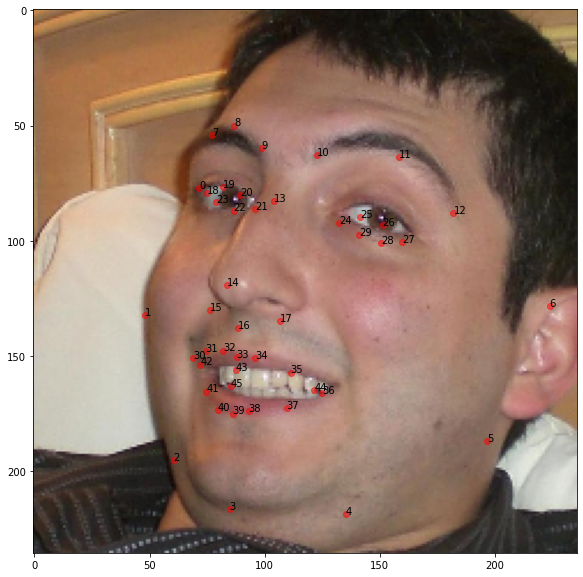

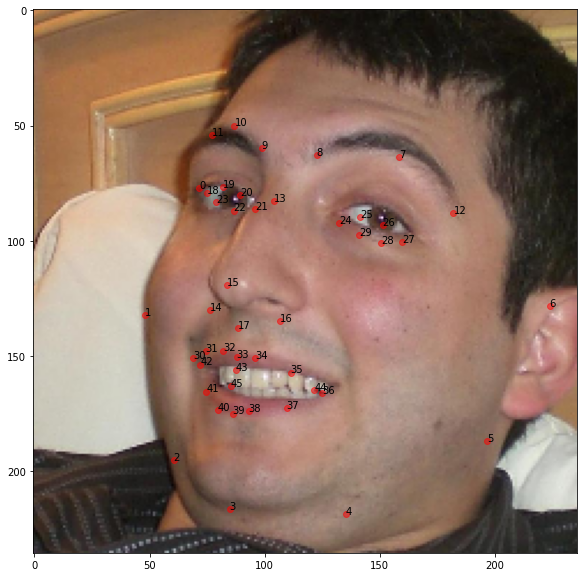

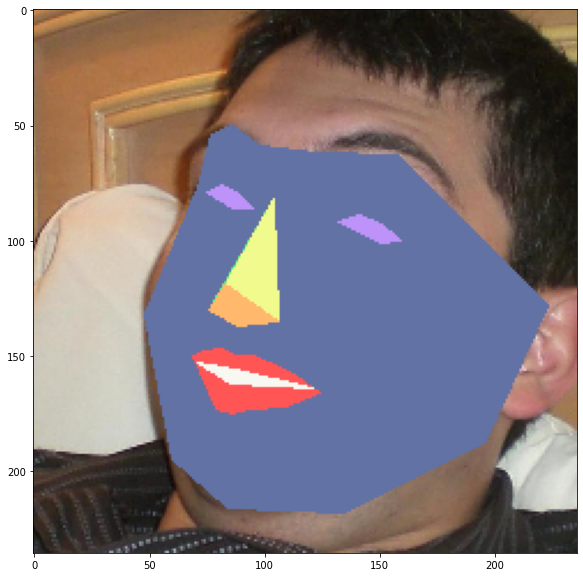

In [ ]:
sfs(best[0], val=True, show_points=True, name='10')

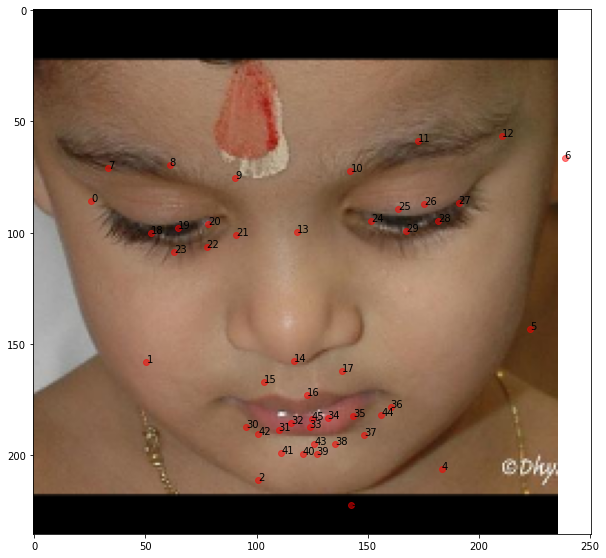

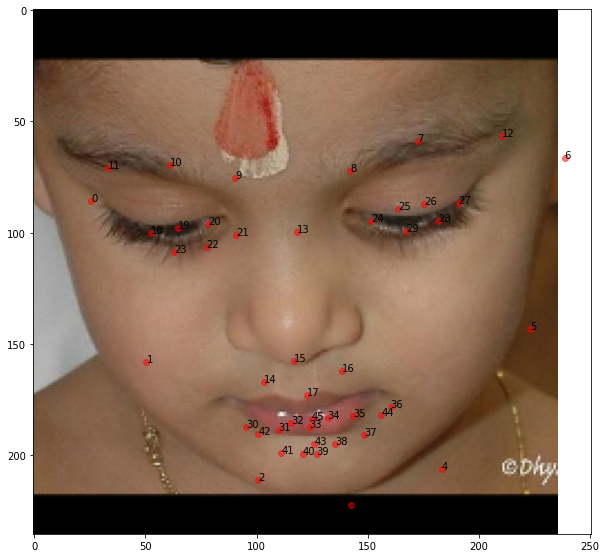

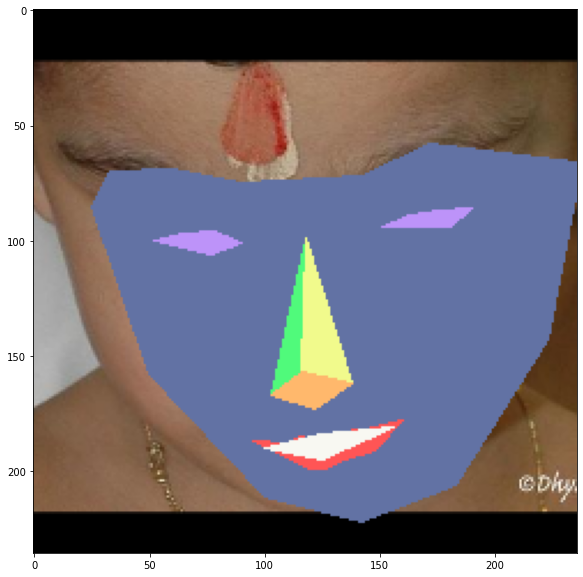

In [ ]:
sfs(worst[0], val=True, show_points=True, name='11')

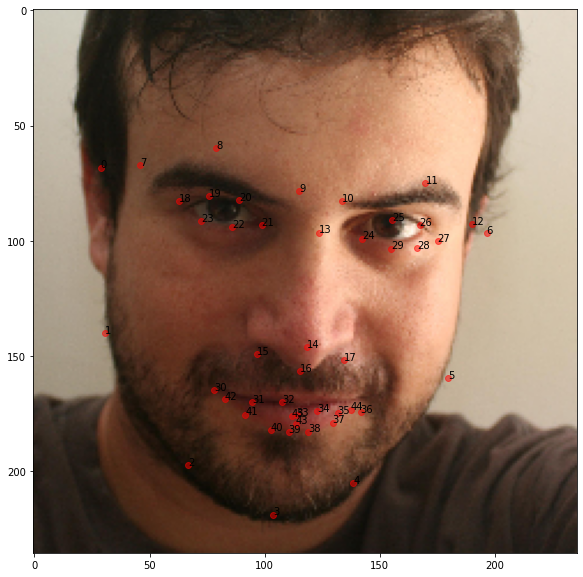

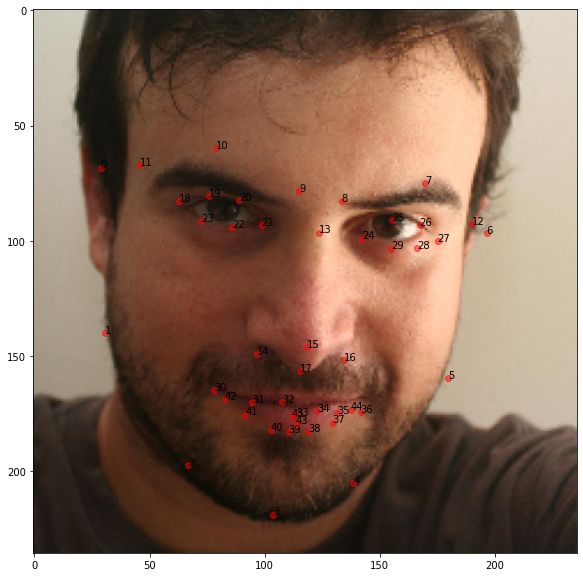

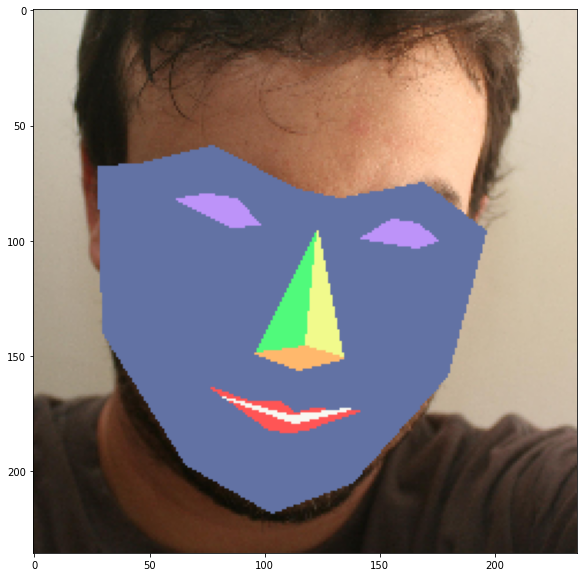

In [ ]:
sfs(35, show_points=True, name='12')

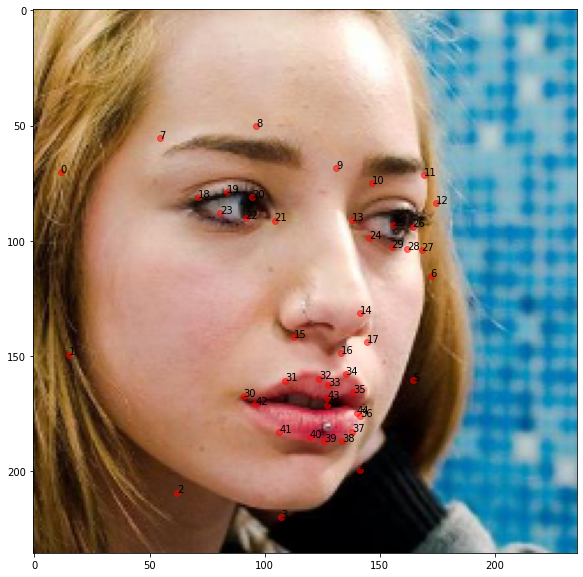

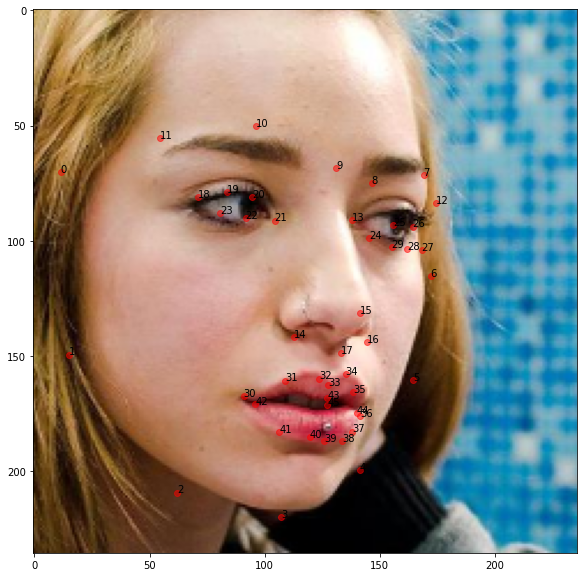

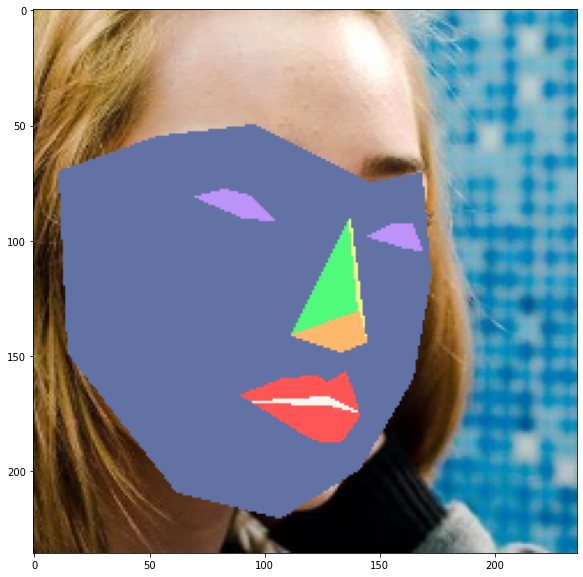

In [ ]:
sfs(55, show_points=True, name='13')

#Simple Graphical Effect

In [ ]:
from sympy import Point, Line, Segment, Float
from PIL import Image
import random

In [ ]:
if not Path('googly-eye.png').is_file():
  !wget https://s3.imgcdn.dev/kQN4C.png -O googly-eye.png

In [ ]:
def get_midpoint(p1, p2, line):
  raw_coords = p1.midpoint(p2)
  coords = [Float(raw_coords.coordinates[0]) - (line / 2), Float(raw_coords.coordinates[1]) - (line / 2)]
  return coords


def sge(idx, name, val=False, show_points=False, ):
  img, predicted_points = covert_point_locations(idx, val, name, show_points)

  left_angle = random.randint(0,360)
  right_angle = random.randint(0,360)

  p1, p2, p3, p4 = Point(predicted_points[18]), Point(predicted_points[21]), Point(predicted_points[24]), Point(predicted_points[27])
  
  left_length = Segment(p1, p2).length * 2
  right_length = Segment(p3, p4).length * 2

  left_eye_coord = get_midpoint(p1, p2, left_length)
  right_eye_coord = get_midpoint(p3, p4, right_length)

  googly = Image.open('googly-eye.png')
  googly = googly.convert("RGBA")

  googly_left = googly.resize((left_length,left_length))
  googly_right = googly.resize((right_length,right_length))

  pil_image = Image.fromarray(img)
  pil_image = pil_image.convert("RGBA")
  
  pil_image.paste(googly_left.rotate(left_angle), left_eye_coord, googly_left.rotate(left_angle))
  pil_image.paste(googly_right.rotate(right_angle), right_eye_coord, googly_right.rotate(right_angle))
  
  plt.figure(figsize=(10,10))
  pil_image_np = np.asarray(pil_image)
  plt.imshow(pil_image_np)
  plt.savefig('%s.png' % name)
  plt.show()

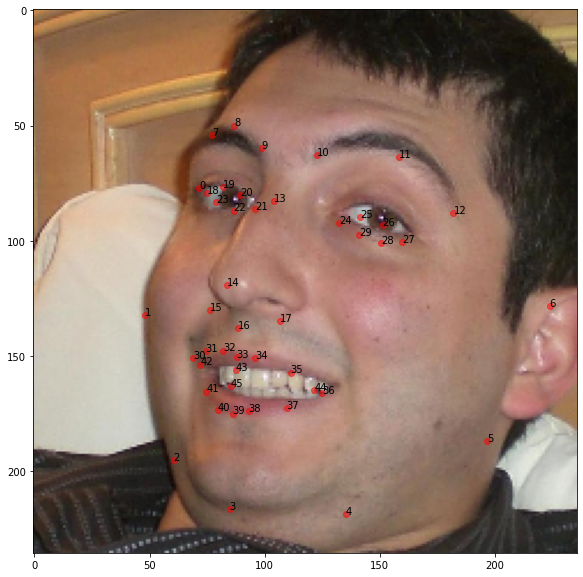

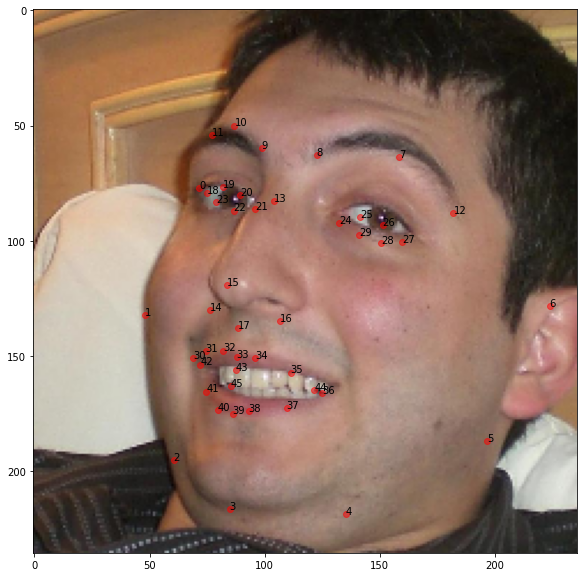

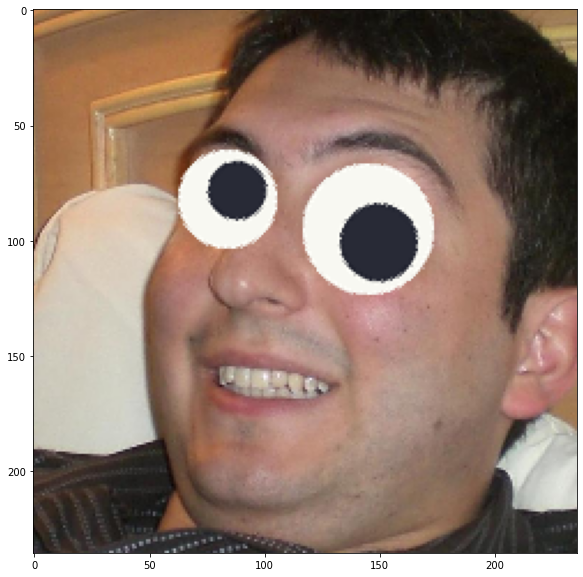

In [ ]:
sge(best[0], val=True, show_points=True, name='14')

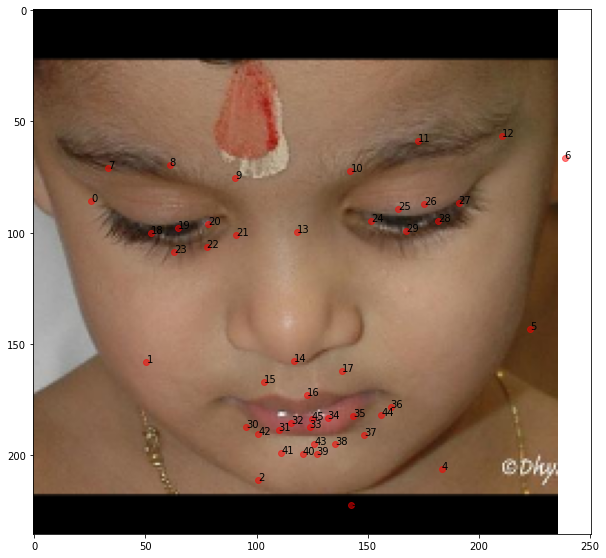

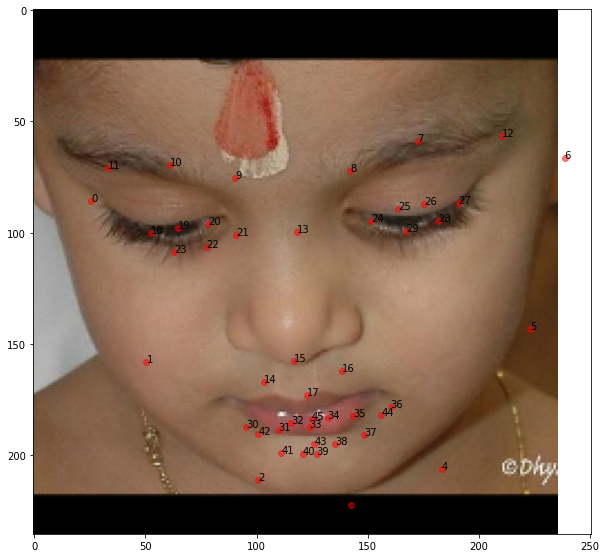

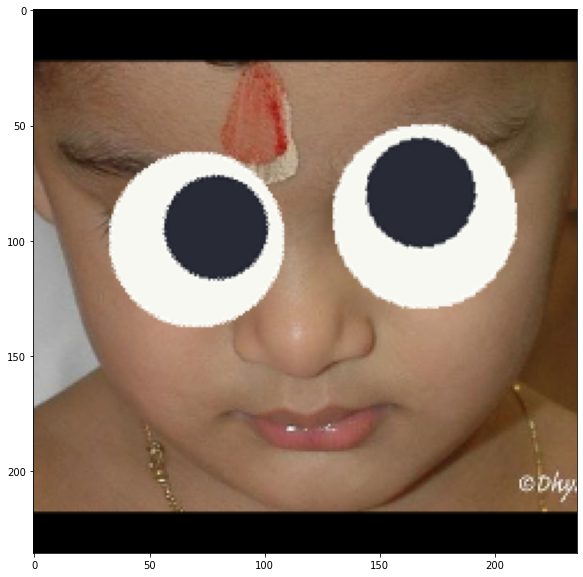

In [ ]:
sge(worst[0], val=True, show_points=True, name='15')

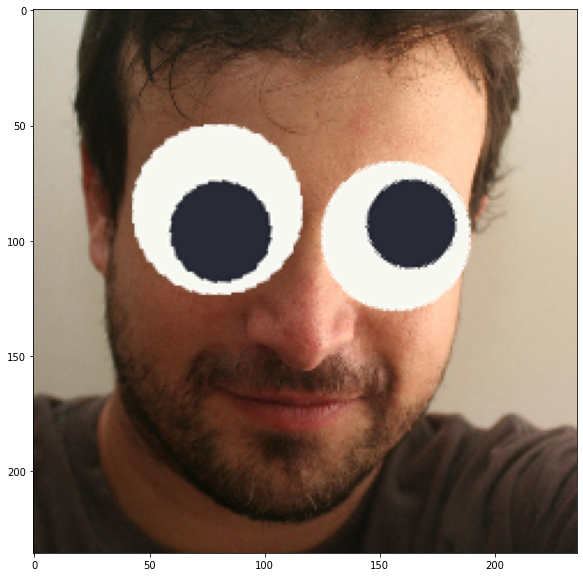

In [ ]:
sge(35, name='16')

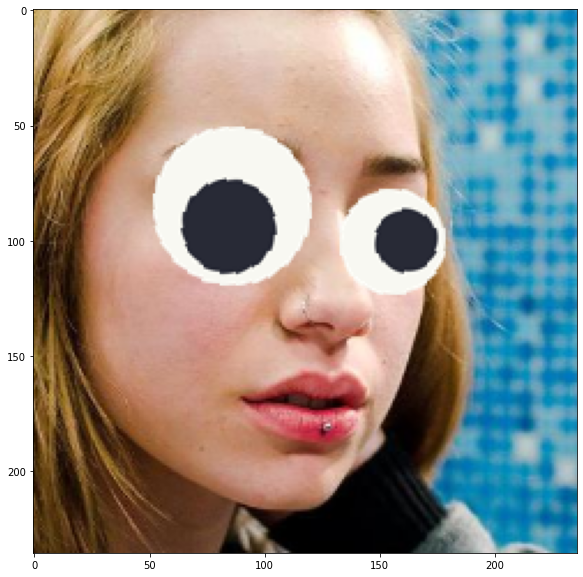

In [ ]:
sge(55, name='17')

# Test Images CSV

In [ ]:
save_as_csv(get_all_predictions(np.array(hog_test_images)), location='/content')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
!rm all.zip
!zip -r all.zip /content/*.png results.csv

  adding: content/10.png (deflated 1%)
  adding: content/10-post-points.png (deflated 1%)
  adding: content/10-pre-points.png (deflated 1%)
  adding: content/11.png (deflated 2%)
  adding: content/11-post-points.png (deflated 1%)
  adding: content/11-pre-points.png (deflated 1%)
  adding: content/12.png (deflated 1%)
  adding: content/12-post-points.png (deflated 0%)
  adding: content/12-pre-points.png (deflated 0%)
  adding: content/13.png (deflated 1%)
  adding: content/13-post-points.png (deflated 0%)
  adding: content/13-pre-points.png (deflated 0%)
  adding: content/14.png (deflated 1%)
  adding: content/14-post-points.png (deflated 1%)
  adding: content/14-pre-points.png (deflated 1%)
  adding: content/15.png (deflated 1%)
  adding: content/15-post-points.png (deflated 1%)
  adding: content/15-pre-points.png (deflated 1%)
  adding: content/16.png (deflated 1%)
  adding: content/17.png (deflated 1%)
  adding: content/1.png (deflated 3%)
  adding: content/2.png (deflated 3%)
  addi